In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing import image as kimage
from tensorflow.keras.applications.vgg16 import preprocess_input
import matplotlib
import matplotlib.pyplot as plt
import os
from PIL import Image

In [ ]:
project_folder = '/content/drive/MyDrive/Image Retrieval/'

# Model Preparation

## Load feature extraction weights

In [ ]:
img_height = img_width = 160

In [ ]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

preprocess_input = tf.keras.applications.vgg16.preprocess_input

base_model = tf.keras.applications.VGG16(input_shape=(img_height,img_width,3),
                                               include_top=False,
                                               weights='imagenet')
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()


58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
inputs = tf.keras.Input(shape=(img_height,img_width,3))
x = data_augmentation(inputs)
x = preprocess_input(x)
outputs = base_model(x)

feature_extract_model = tf.keras.Model(inputs, outputs)
feature_extract_model.compile(tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
              metrics=['accuracy'])


In [ ]:
feature_extract_model.load_weights(project_folder + "feature_extraction_weights.h5")

## Load numpy data feature of trained model

In [ ]:
data_features_load = np.load(project_folder + "data_features_train.npy", allow_pickle=True)
data_features_load.shape

(28575, 12800)

## Load trained Model

In [ ]:
inputs = tf.keras.Input(shape=(img_height,img_width,3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.25)(x)
x = tf.keras.layers.Dense(units=512, activation='relu')(x)
x = tf.keras.layers.Dense(units=256, activation='relu')(x)
outputs = tf.keras.layers.Dense(units=134, activation='softmax')(x)

trained_model = tf.keras.Model(inputs, outputs)

trained_model.load_weights(project_folder + 'model_imagerv.h5')
trained_model.compile(tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
              metrics=['accuracy'])


## Load VGG16 Feature Extraction

In [ ]:
VGG16_feature_extraction = tf.keras.applications.VGG16(include_top=False, 
                                    weights='imagenet', 
                                    input_shape=(86, 128, 3))

In [ ]:
data_features_load2 = np.load(project_folder + "VGG16_data_features.npy", allow_pickle=True)


In [ ]:
data_features_load2.shape

(28575, 4096)

# Prediction

## Prediction Functions

In [ ]:
#text_labels = pd.read_csv(project_folder + 'Text_Labels.csv', usecols = ['Text_Label'])
img_paths = pd.read_csv(project_folder + 'ImgPaths.csv', usecols = ['ImgPath'])


In [52]:
from collections import OrderedDict

# sort
def getKey(item):
    return item[0]

def reformat_text(text_label):
  return (' ').join(map(lambda x: x.capitalize() , text_label.split('_')))

def get_sims1(query_np, num_imgs):
  query_np1 = tf.image.resize(query_np, (img_height, img_width))
  query_np1 = np.expand_dims(query_np1, axis=0)
  query_feature1 = feature_extract_model.predict(query_np1)
  query_feature1 = np.reshape(query_feature1, (1,-1))

  y_pred = trained_model.predict(query_np1)
  label = int(np.argmax(y_pred, axis = 1))
  text_label = text_labels.iloc[label]["Text_Label"].split('.')[0]

  sims1 = cosine_similarity(query_feature1, data_features_load).squeeze()
  indices = [i for i in range(28575)]
  tps1 = zip(sims1.tolist(), indices)
  return sorted(tps1, key=getKey, reverse=True)[:num_imgs], text_label

def get_sims2(query_np, num_imgs):
  query_np = np.expand_dims(query_np, axis=0)
  query_np = preprocess_input(query_np)
  query_features2 = VGG16_feature_extraction.predict(query_np)
  query_features2 = np.reshape(query_features2, (1,-1))

  sims2 = cosine_similarity(query_features2, data_features_load2).squeeze()
  indices = [i for i in range(28575)]
  tps2 = zip(sims2.tolist(), indices)
  return sorted(tps2, key=getKey, reverse=True)[:num_imgs]

def get_final_sims(query_np, num_imgs):
  tps_sorted1, text_label = get_sims1(query_np, num_imgs)
  tps_sorted2 = get_sims2(query_np, num_imgs)
  tps_sorted = tps_sorted1 + tps_sorted2
  tps_sorted = sorted(tps_sorted, key = getKey, reverse = True)
  tps_sorted = list(map(lambda x: x[1], tps_sorted))
  return list(OrderedDict.fromkeys(tps_sorted))[:num_imgs], reformat_text(text_label)

def get_popular_label(result_paths, range_num):
  labels = list(map(lambda x: x.split('/')[1], result_paths[:range_num]))
  freq = [labels.count(i) for i in labels]
  return reformat_text(labels[freq.index(max(freq))])

def get_result_paths(tps_sorted):
  return list(map(lambda x: img_paths.iloc[x]['ImgPath'], tps_sorted))

In [ ]:
def search_img(file_name, num_imgs, range_popular = 20):
  query = kimage.load_img(file_name, target_size=(86, 128))
  plt.figure(figsize=(4,4))
  plt.imshow(query)

  query_np = kimage.img_to_array(query)
  tps_sorted, text_label = get_final_sims(query_np, num_imgs)

  result_paths = get_result_paths(tps_sorted)
  
  popular_text_label = get_popular_label(result_paths, range_num = range_popular)
  plt.title(f'Popular: {popular_text_label}, Model predicted: {text_label}')


  fig = plt.figure(figsize=(12,12))
  columns = 4
  rows = num_imgs // 4 if num_imgs % 4 == 0 else (num_imgs // 4 + 1)
  for i in range(1, num_imgs + 1):
      img = Image.open(result_paths[i-1])
      fig.add_subplot(rows, columns, i)
      
      plt.axis('off')
      plt.imshow(img)

  return result_paths, popular_text_label, text_label

## Get result image paths

1/1 [==============================] - 0s 297ms/step


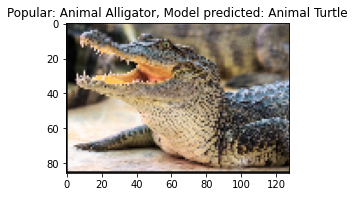

In [53]:
result_paths, popular_text_label, text_label = search_img('query/query.png', num_imgs = 30)

Text(0.5, 1.0, 'Path: dataset/animal_Cheetah/160.jpg')

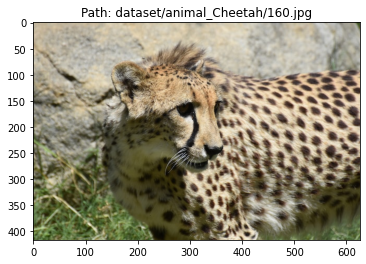

In [ ]:
from PIL import Image

r = -1
img = Image.open(result_paths[r])
plt.imshow(img)
plt.title(f'Path: {result_paths[r]}')

In [54]:
popular_text_label, text_label

('Animal Alligator', 'Animal Turtle')

In [55]:
result_paths

['dataset/animal_Alligator/9.jpg',
 'dataset/animal_Cock/81.jpg',
 'dataset/animal_Alligator/139.jpg',
 'dataset/animal_Giraffe/50.jpg',
 'dataset/animal_Giraffe/50.jpg',
 'dataset/animal_Fish/223.jpg',
 'dataset/animal_Frog/179.jpg',
 'dataset/animal_Lizard/188.jpg',
 'dataset/animal_Cheetah/49.jpg',
 'dataset/scenery_cave/13.jpg',
 'dataset/scenery_cave/13.jpg',
 'dataset/animal_Frog/54.jpg',
 'dataset/animal_panda/204.jpg',
 'dataset/animal_bird/138.jpg',
 'dataset/animal_Monkey/41.jpg',
 'dataset/plant_Moss/194.jpg',
 'dataset/animal_Turtle/42.jpg',
 'dataset/animal_cows/99.jpg',
 'dataset/animal_Cheetah/115.jpg',
 'dataset/animal_Alligator/13.jpg',
 'dataset/animal_Duck/85.jpg',
 'dataset/animal_Lizard/78.jpg',
 'dataset/animal_Lizard/78.jpg',
 'dataset/animal_Cock/84.jpg',
 'dataset/animal_Duck/190.jpg',
 'dataset/animal_Cheetah/200.jpg',
 'dataset/animal_Cheetah/1.jpg',
 'dataset/animal_Rabbit/147.jpg',
 'dataset/animal_bird/221.jpg',
 'dataset/animal_Cheetah/160.jpg']

## Example Prediction

1/1 [==============================] - 0s 230ms/step


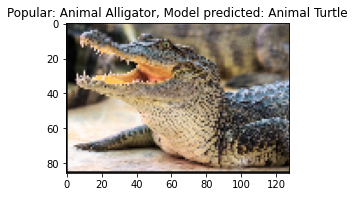

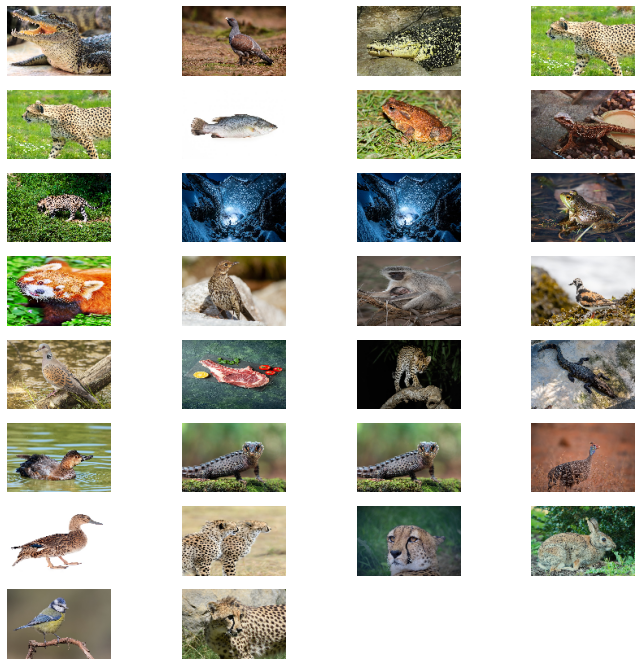

In [ ]:
search_img('query.png', num_imgs = 30)

1/1 [==============================] - 0s 164ms/step


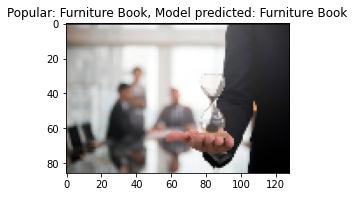

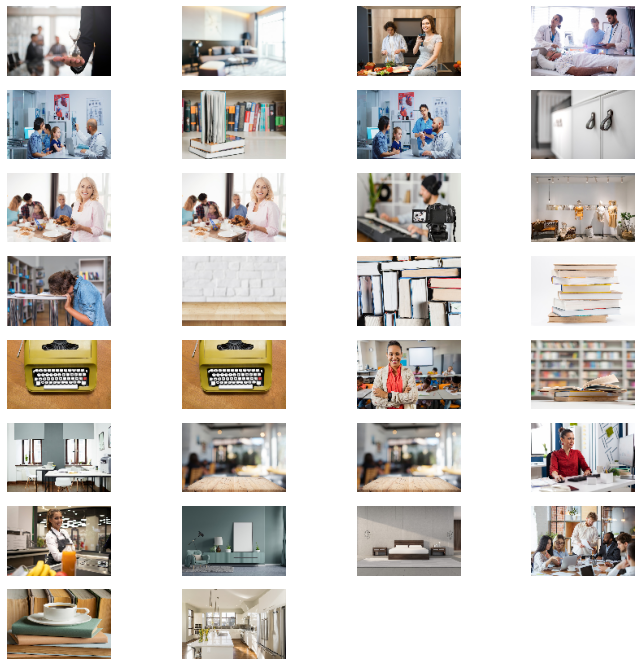

In [ ]:
search_img('query2.PNG', num_imgs = 30)

1/1 [==============================] - 0s 148ms/step


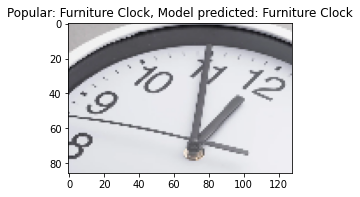

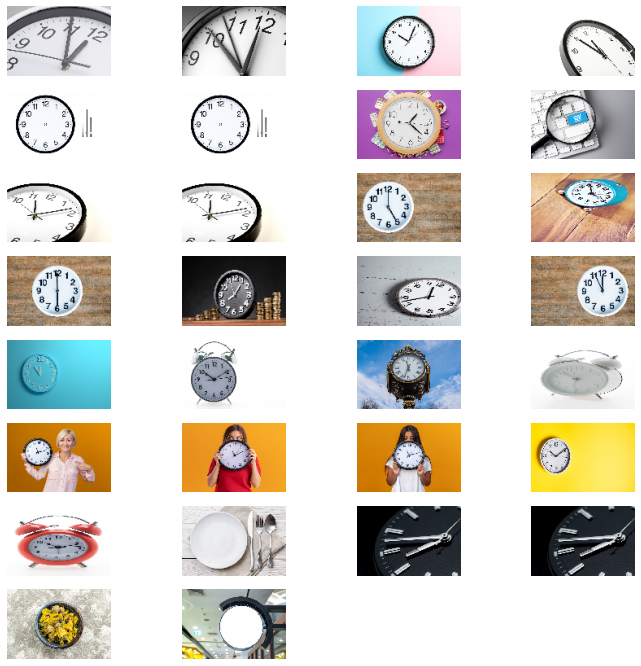

In [ ]:
search_img('qur3.PNG', num_imgs = 30)

1/1 [==============================] - 0s 155ms/step


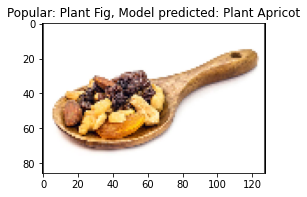

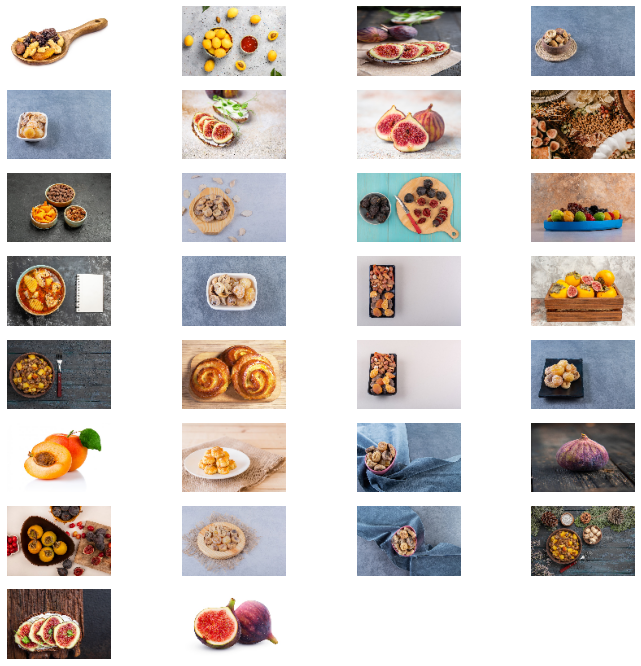

In [ ]:
search_img('qur4.PNG', num_imgs = 30)

1/1 [==============================] - 0s 154ms/step


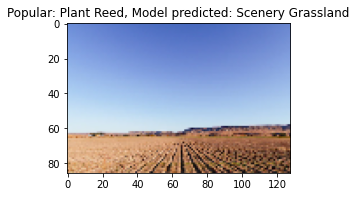

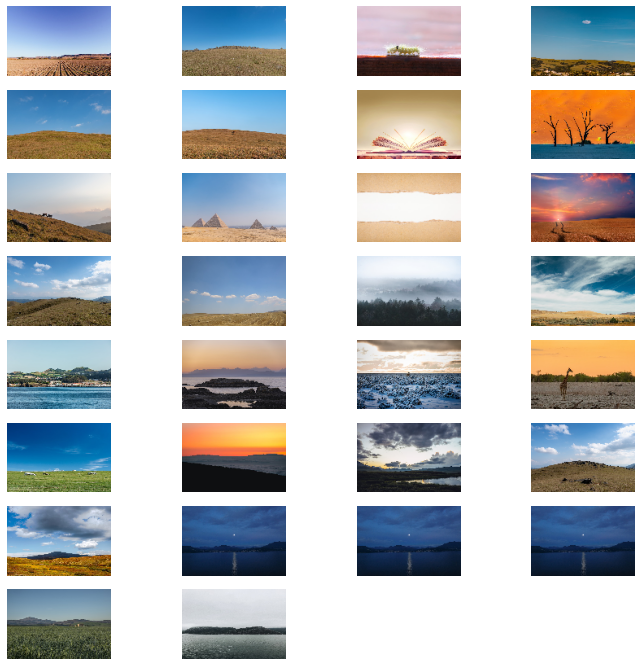

In [ ]:
search_img('qur5.PNG', num_imgs = 30, range_popular = 10)

1/1 [==============================] - 0s 156ms/step


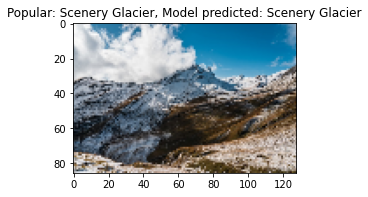

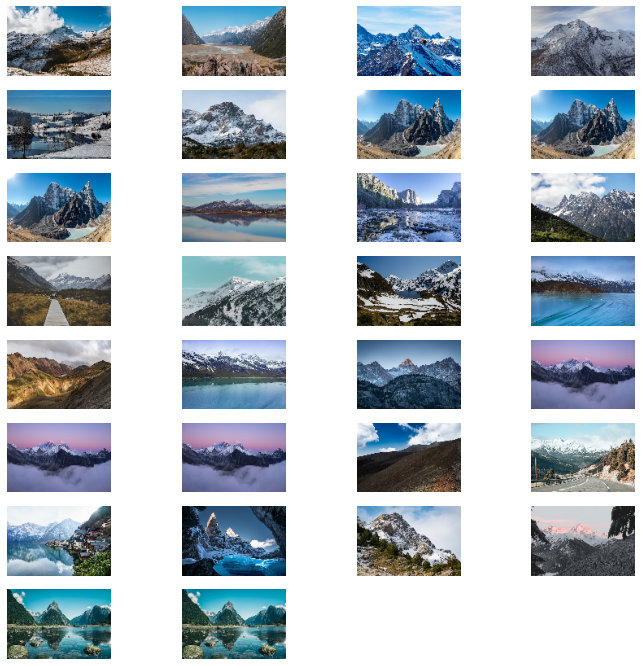

In [ ]:
search_img('qur6.PNG', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 158ms/step


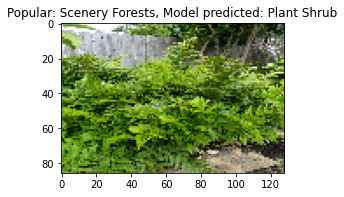

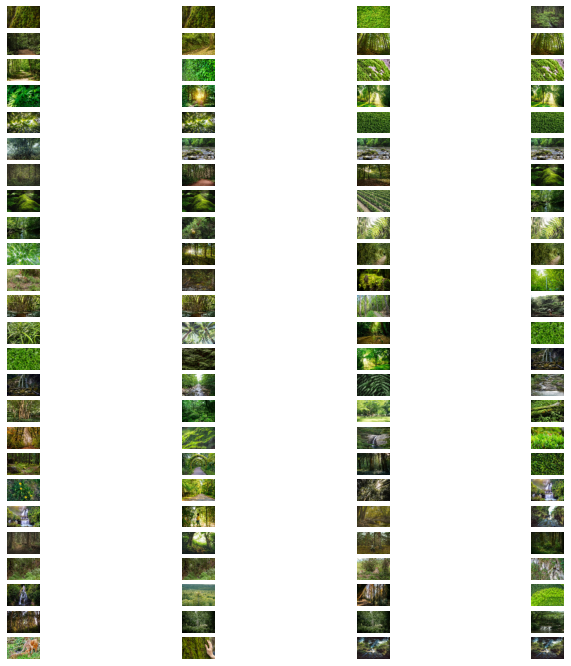

In [ ]:
search_img('qur7_fern.jpg', num_imgs = 100)

1/1 [==============================] - 0s 168ms/step


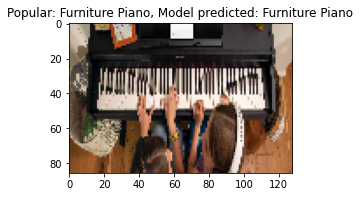

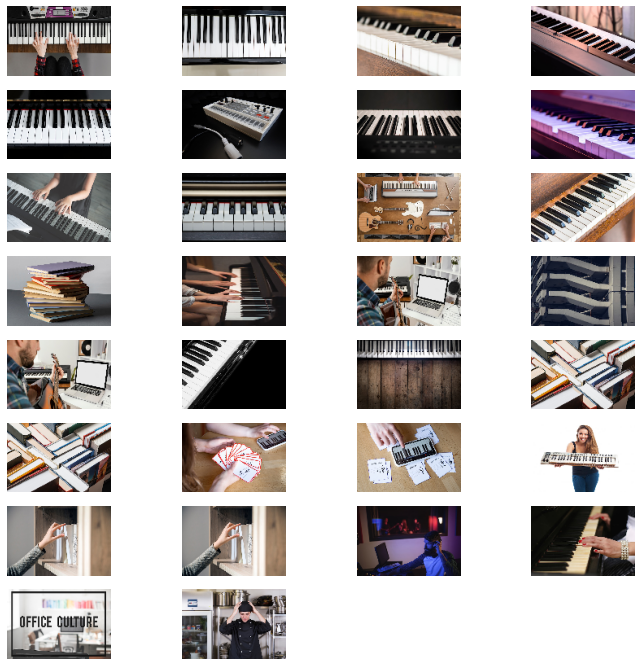

In [ ]:
search_img('qur8.jpg', num_imgs = 30, range_popular = 30)

1/1 [==============================] - 0s 283ms/step


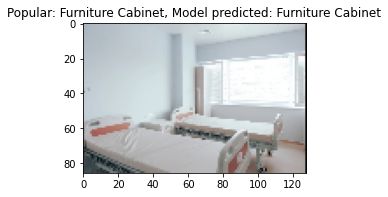

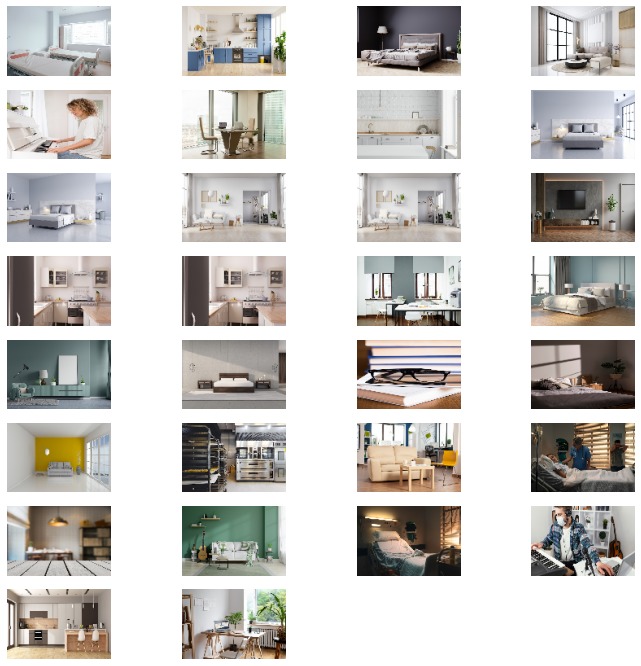

In [ ]:
search_img('qur9.PNG', num_imgs = 30, range_popular = 15)

1/1 [==============================] - 0s 156ms/step


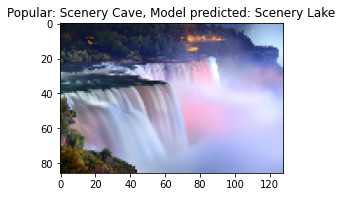

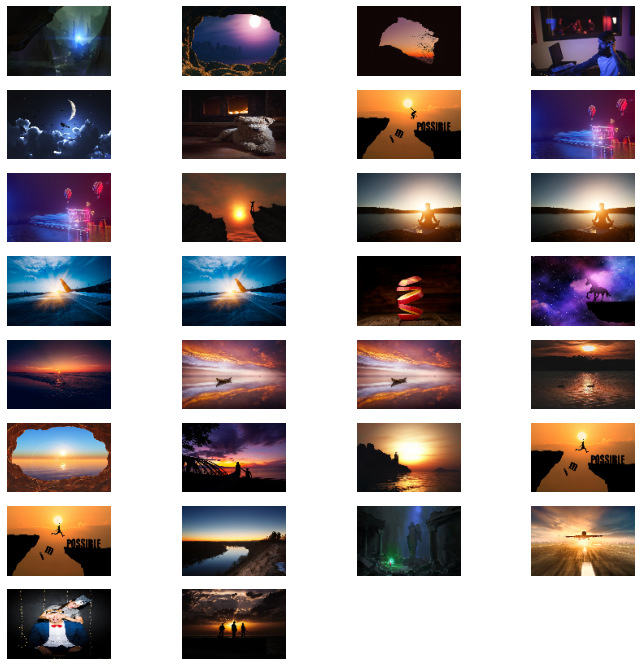

In [ ]:
search_img('qur10.png', num_imgs = 30, range_popular = 30)

1/1 [==============================] - 0s 153ms/step


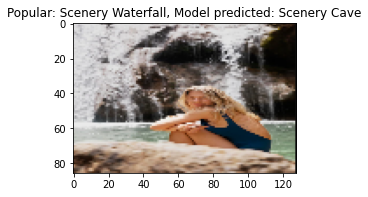

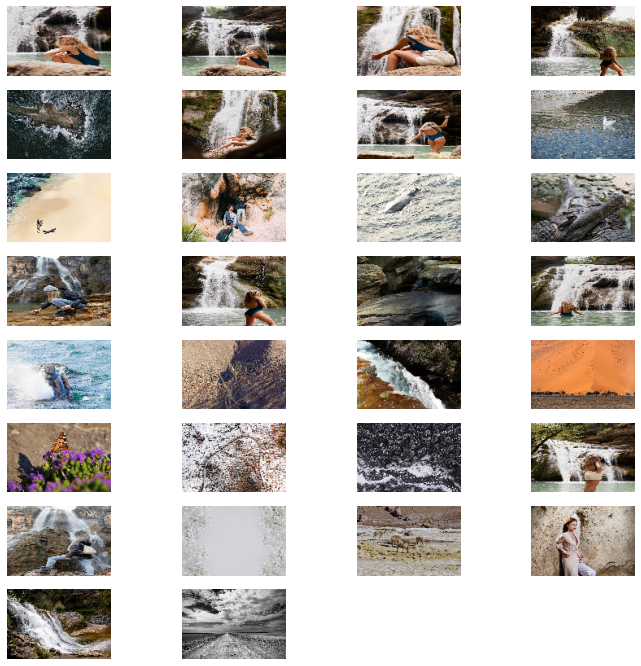

In [ ]:
search_img('qur11.PNG', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 151ms/step


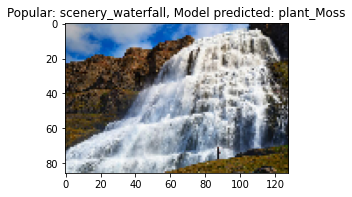

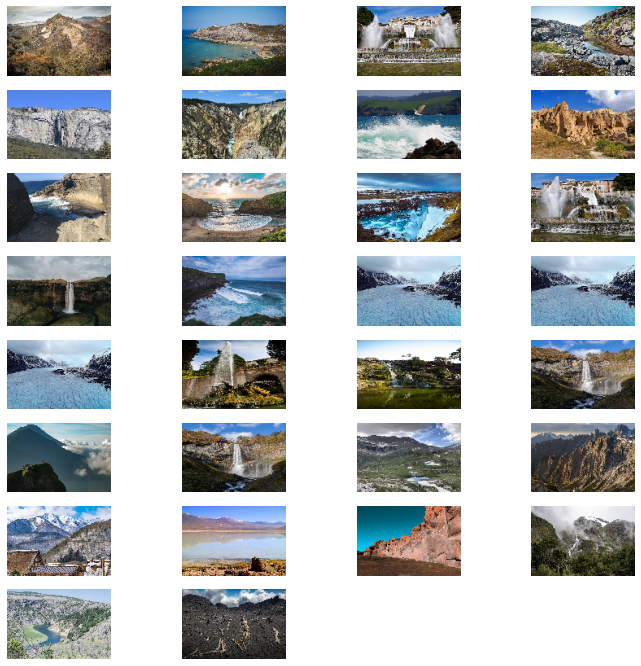

In [ ]:
search_img('qur12.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 162ms/step


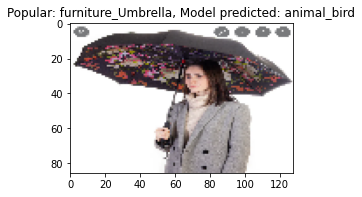

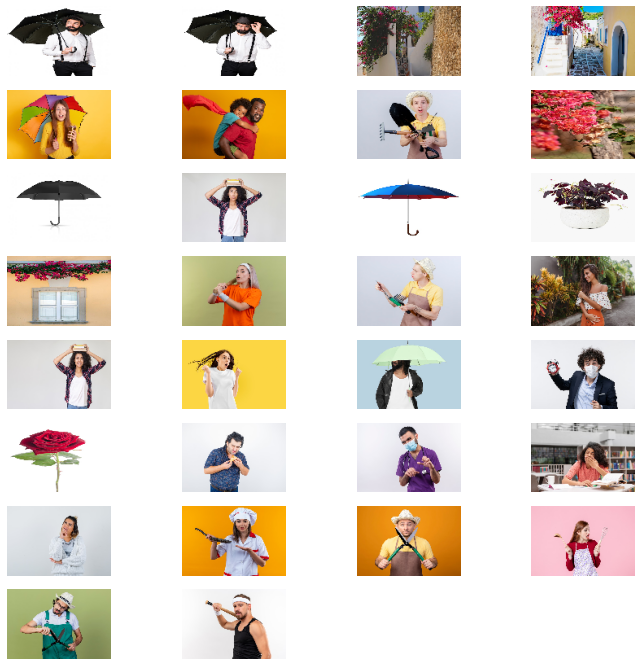

In [ ]:
search_img('qur13.PNG', num_imgs = 30, range_popular = 30)

1/1 [==============================] - 0s 155ms/step


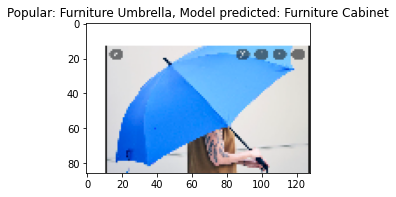

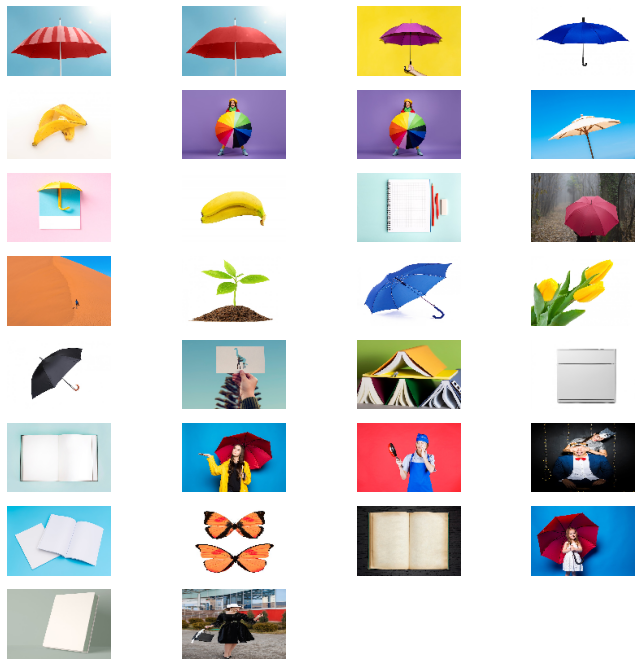

In [ ]:
search_img('qur14.PNG', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 154ms/step


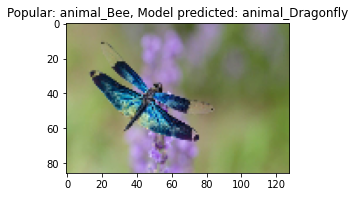

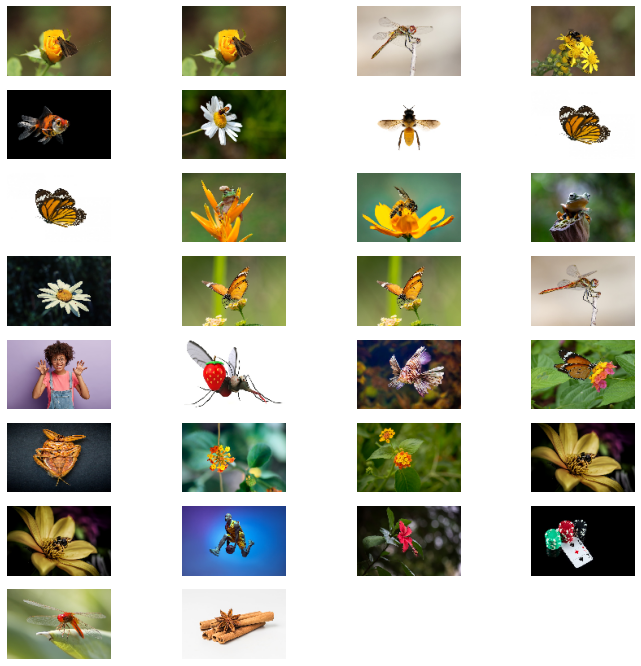

In [ ]:
search_img('qur15.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 150ms/step


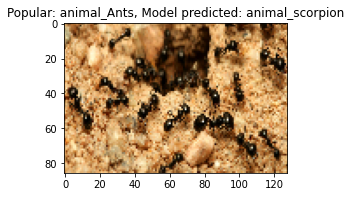

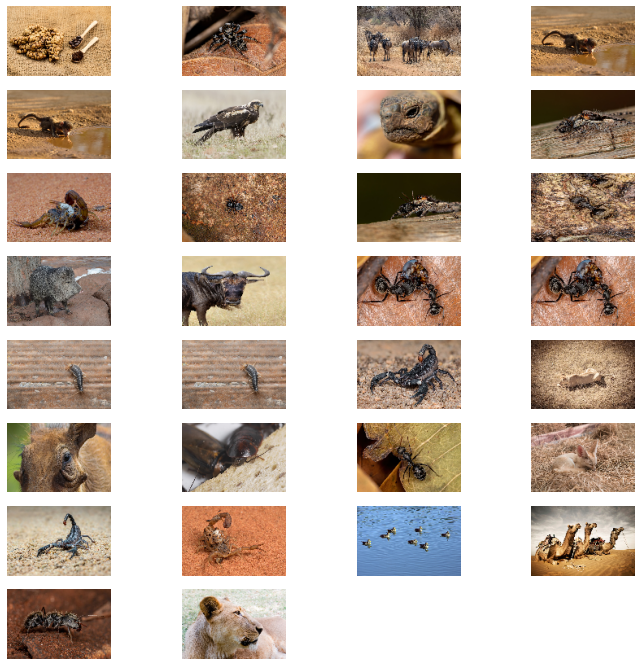

In [ ]:
search_img('qur16.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 158ms/step


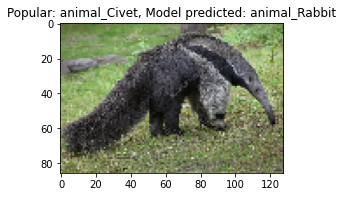

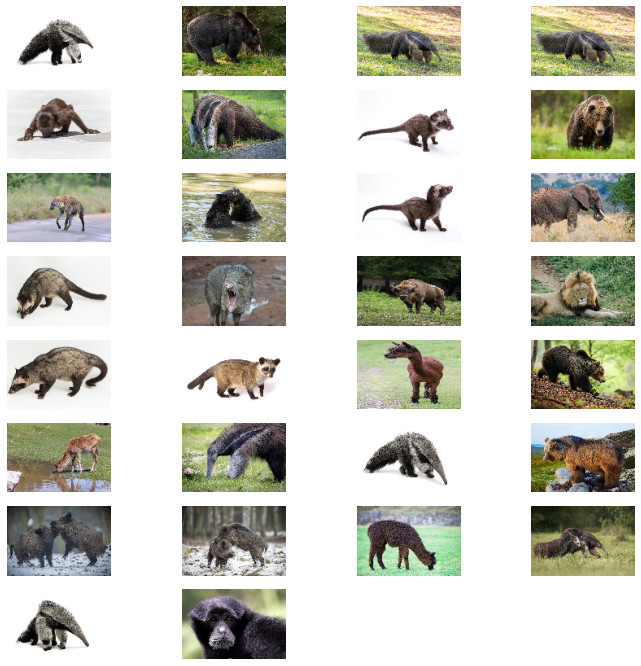

In [ ]:
search_img('qur17_anteater.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 160ms/step


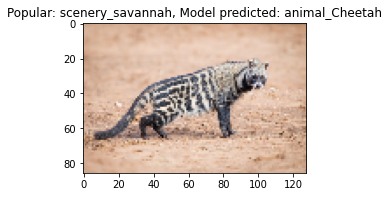

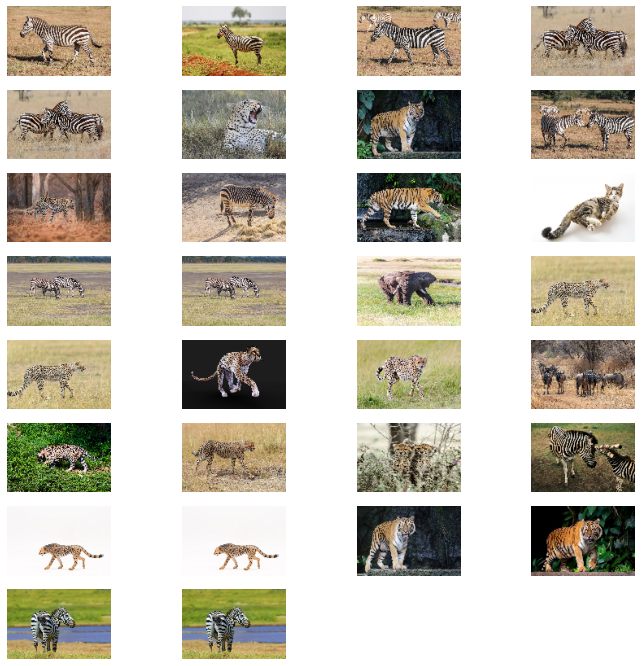

In [ ]:
search_img('qur18-Civet.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 159ms/step


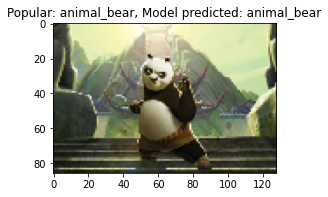

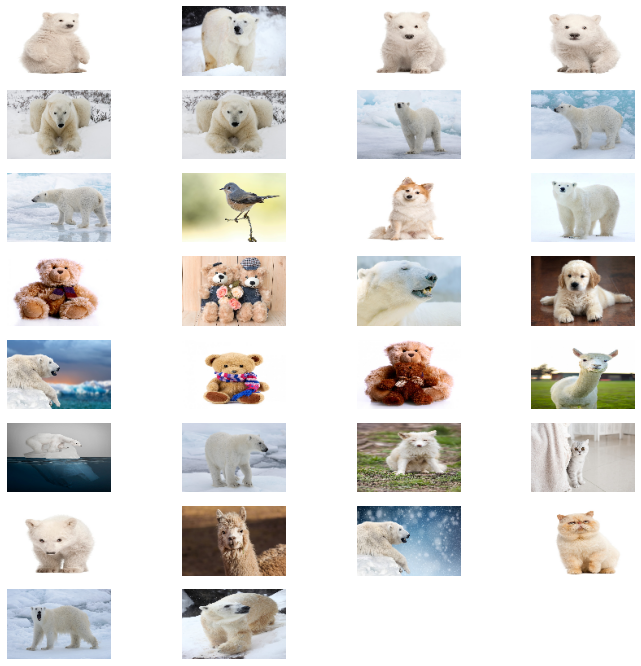

In [ ]:
search_img('qur19.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 154ms/step


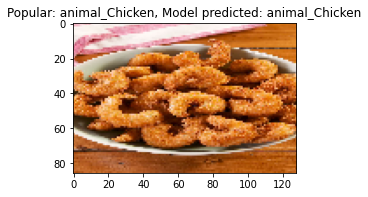

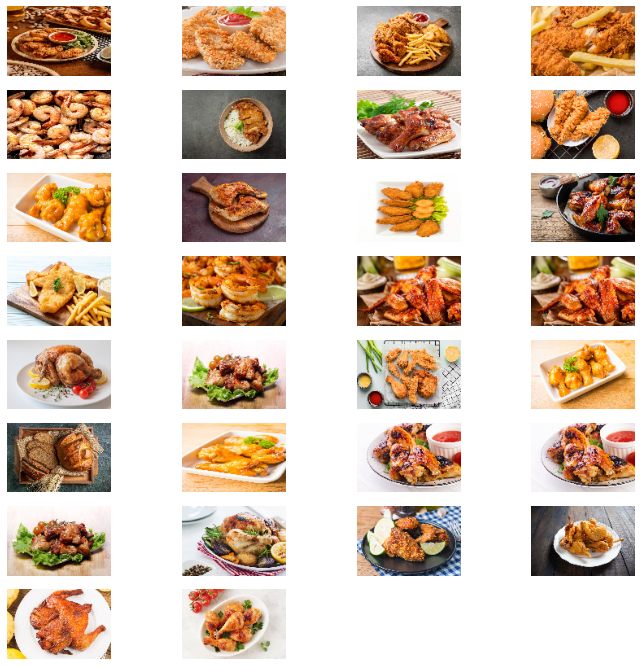

In [ ]:
search_img('qur20_shrimp.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 157ms/step


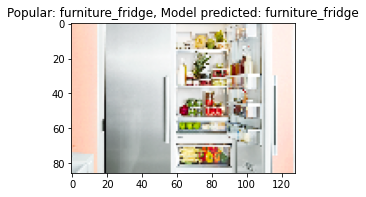

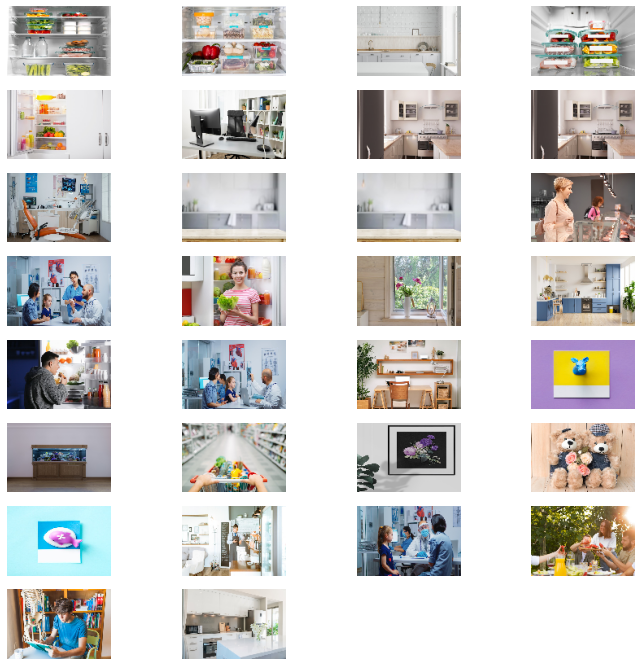

In [ ]:
search_img('qur21.png', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 153ms/step


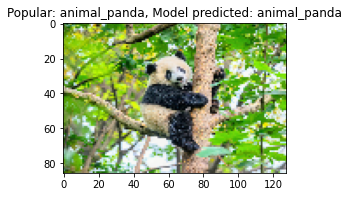

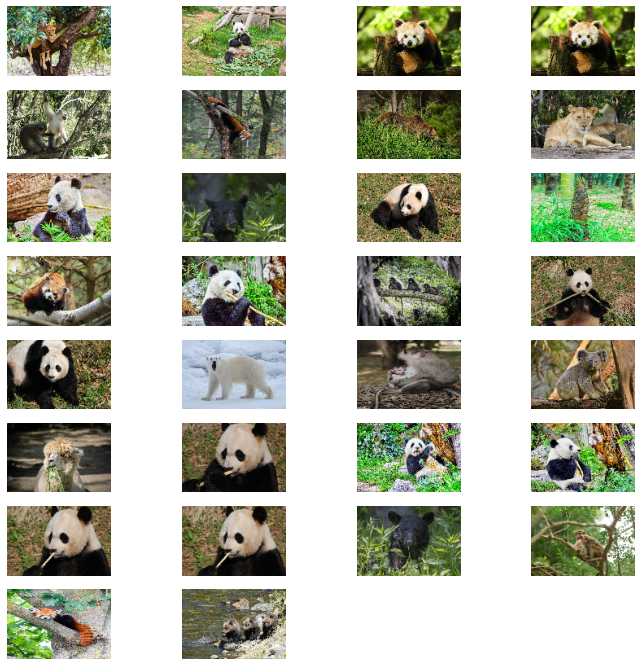

In [ ]:
search_img('qur22.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 146ms/step


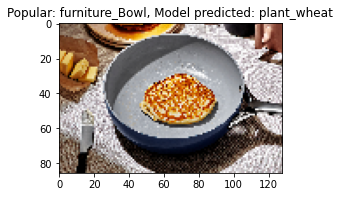

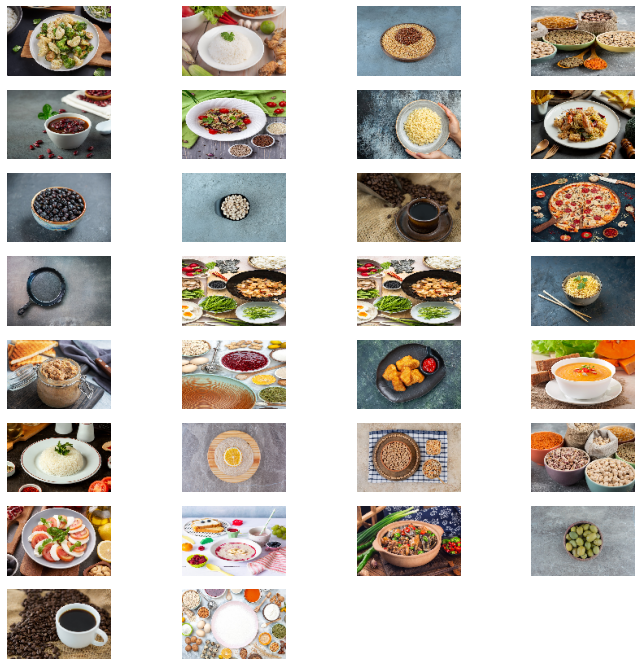

In [ ]:
search_img('qur23_pan.png', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 159ms/step


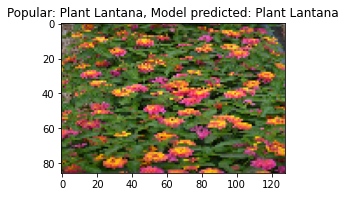

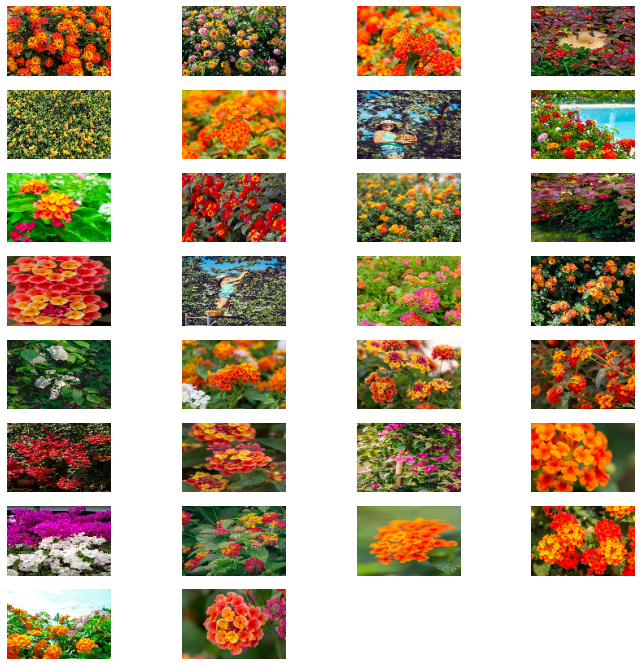

In [ ]:
search_img('qur24_lantana.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 158ms/step


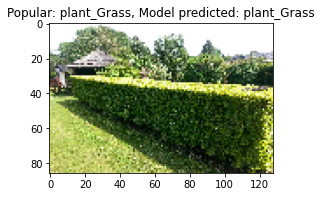

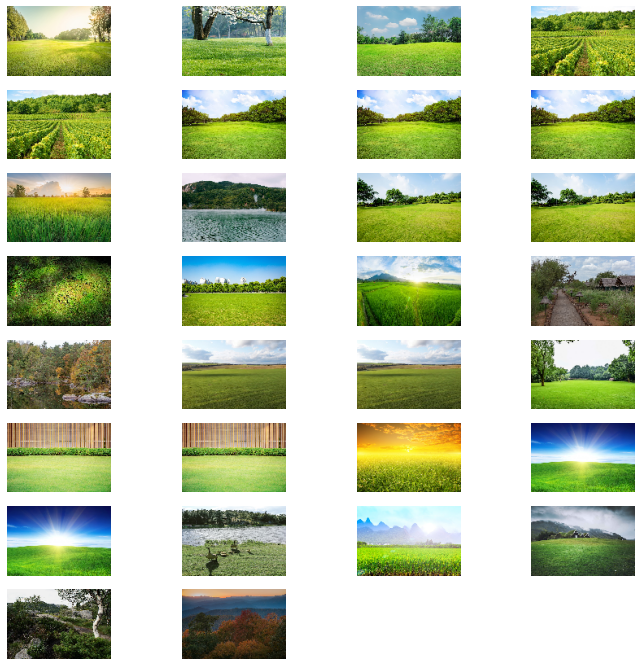

In [ ]:
search_img('qur25-hedges.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 156ms/step


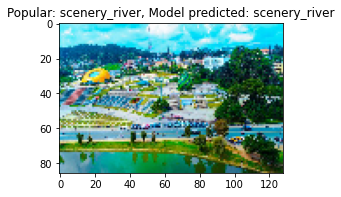

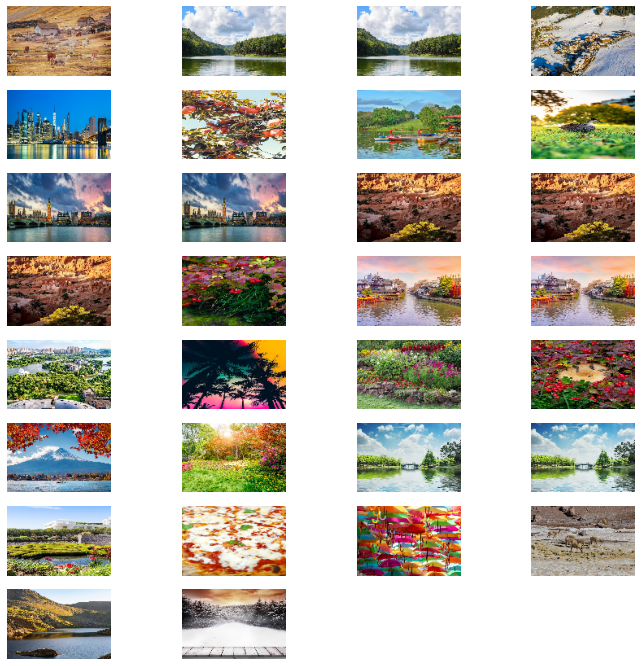

In [ ]:
search_img('qur26.jpg', num_imgs = 30, range_popular = 20)

1/1 [==============================] - 0s 166ms/step


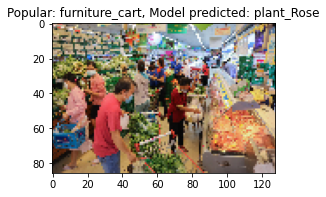

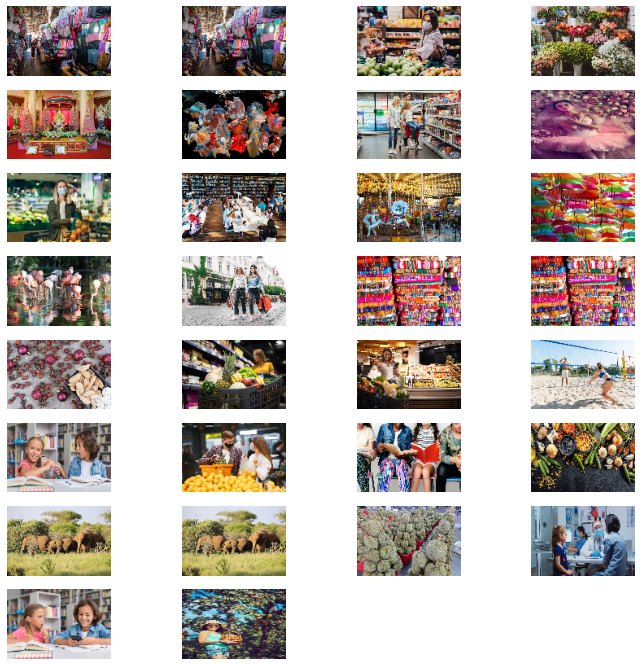

In [ ]:
search_img('qur27.jpg', num_imgs = 30, range_popular = 20)